# SKW Binary Segmentation Training (v2)

U-Net segmentation on the SKW drone dataset using fastai DataBlock.

- Original: 434 images (792x792) + data_v2: ~33k images (792-910px) from initial + 73 extra batches
- YOLO bbox labels rasterized into binary masks
- Pretrained ImageNet encoder via segmentation-models-pytorch
- Dice + center-weighted CE loss (weighting computed in loss function)
- fastai batch transforms for augmentations (no callbacks)

In [1]:
import sys

import torch
import numpy as np
from pathlib import Path
from fastai.vision.all import *

sys.path.insert(0, str(Path.cwd().parent))
sys.path.insert(0, str(Path.cwd()))

In [2]:
from data import build_dataloaders
from model import UnetWithCentroids
from loss import DiceCELoss, center_distance_weights
from metrics import ForegroundIoU, SegDiceMulti, CentroidCountMAE, CentroidCountMAPE
from augs import (
    BatchFlip,
    BatchRot90,
    BatchRotate,
    RandomClipLargeImages,
    BatchResample,
)
from visualise import (
    plot_batch,
    plot_centroid_targets,
    plot_center_distance_weights,
    plot_val_predictions,
)
from validate import print_dataset_summary, validate_dataset

from shared.helpers import print_system_info
from shared.augs import (
    RandomRectangle,
    RandomSharpenBlur,
    DynamicZScoreNormalize,
)
from detection.helpers import plot_channel_histograms

In [3]:
print_system_info()

System Information
-----------------------------------
PyTorch Version : 2.10.0+cu128
CUDA Available  : Yes
CUDA Version    : 12.8
Python Version  : 3.13.7
Fastai Version  : 2.8.7
Default Device  : cuda:0
Device Name     : NVIDIA GeForce RTX 4090
-----------------------------------


In [4]:
# Configuration
model_type = "convnextv2_tiny.fcmae_ft_in22k_in1k"
model_version = "SKW_SEG_v2"
#########################
use_bf16 = True
#########################
canvas_size = 600  # training output tensor size
val_canvas_size = 792  # validation output tensor size (native resolution)
ignore_index = 99  # mask fill value for padding regions
#########################
train_bs = 24
val_bs = 8
gradient_accumulation_batch_size = 24
learning_rate = 3e-4
epoch_count = 10
num_workers = 8
#########################
# Positive oversampling: repeat images with objects N times per epoch
# to rebalance against the ~83% empty tiles in data_v2
positive_oversample = 5
#########################
# Center-distance loss weighting
clip_distance = 30  # erosion depth for center weighting
dice_weight = 10.0
ce_weight = 1.0
# Per-class spatial ramps: {class_id: (max_weight, direction)}
#   "center" = interior gets max, boundary gets 1.0
#   "edge"   = boundary gets max, interior gets 1.0
class_ramps = {
    1: (5.0, "center"),  # foreground: center pixels weighted most
    0: (2.0, "center"),  # foreground: center pixels weighted most
}
#########################
# Centroid heatmap prediction
centroid_sigma = 12.0  # Gaussian sigma for centroid heatmap targets
centroid_weight = 1.0  # loss weight for centroid branch (BCE focal)
centroid_pos_weight = 10.0  # extra weight on positive centroid pixels (BCE)
centroid_threshold = 0.3  # peak detection threshold for counting
nms_kernel = 61  # ~half median object diameter; allows overlapping neighbors
#########################
train_pct = (
    1.0  # 1.0  # fraction of training data to use (e.g. 0.1 for quick experiments)
)
val_pct = 1.0  # fraction of validation data to use
#########################
data_dir = Path("/media/nick/4TB Working 7/Datasets/SKW")
data_v2_dir = Path("/media/nick/4TB Working 7/Datasets/SKW/data_v2")
#########################
assert data_dir.exists(), f"Dataset not found: {data_dir}"
assert data_v2_dir.exists(), f"Dataset v2 not found: {data_v2_dir}"
print(f"NMS kernel: {nms_kernel}px (for sigma={centroid_sigma})")
print(f"Canvas: train={canvas_size}, val={val_canvas_size}")

NMS kernel: 61px (for sigma=12.0)
Canvas: train=600, val=792


In [5]:
_ = print_dataset_summary(data_dir, data_v2_dir)

Original:  434 images
+ data_v2: 45754 images (+45320 new)
Combined:  Train: 32355, Val: 6539, Test: 6532
Total: 45426


In [6]:
exclude_stems = validate_dataset(data_dir, data_v2_dir, canvas_size)

Dataset unchanged — loaded 1 bad images from cache
1 bad images found
  non-square: 8192x5460: NP_SQ1(13Plants)_100MSDCF___DSC0850.JPG_1086270_r00xc00.jpg
exclude_stems: 1 entries


In [7]:
batch_tfms = [
    BatchFlip(),
    BatchRot90(),
    BatchRotate(max_angle=15.0, ignore_index=ignore_index, p=0.3),
    DynamicZScoreNormalize(target_mean=0.0, target_std=1.0),
    RandomRectangle(p=0.2, sl=0.02, sh=0.1, max_count=3),
    RandomSharpenBlur(min_factor=0.5, max_factor=1.5),
    RandomClipLargeImages(min_size=300, max_size=300),
    BatchResample(min_scale=0.45, max_scale=1.1, plateau_min=0.5, plateau_max=1.0),
]

In [8]:
dls = build_dataloaders(
    data_dir=data_dir,
    data_v2_dir=None,  # data_v2_dir,
    positive_oversample=positive_oversample,
    exclude_stems=exclude_stems,
    canvas_size=canvas_size,
    val_canvas_size=val_canvas_size,
    ignore_index=ignore_index,
    train_bs=train_bs,
    val_bs=val_bs,
    batch_tfms=batch_tfms,
    shape="ellipse",
    centroid_sigma=centroid_sigma,
    num_workers=num_workers,
    train_pct=train_pct,
    val_pct=val_pct,
)

Oversampling: 381 pos x5 = 1905 + 8 neg = 1913 train (100% pos), 45 val


In [9]:
# Inspect a training batch
batch = next(iter(dls.train))
images, targets = batch[0], batch[1]
masks = targets[:, 0]
centroids = targets[:, 1]
print(f"Image shape: {images.shape}")
print(f"Target shape: {targets.shape}")
print(f"Mask shape:  {masks.shape}")
print(f"Centroid shape: {centroids.shape}")
print(f"Mask unique values: {masks.unique().tolist()}")
print(f"Centroid range: [{centroids.min().item():.4f}, {centroids.max().item():.4f}]")
valid_mask = masks != ignore_index
print(
    f"Foreground pixel ratio (valid only): {masks[valid_mask].float().mean().item():.4f}"
)
print(f"Padding pixel ratio: {(~valid_mask).float().mean().item():.4f}")
print(f"Image dtype: {images.dtype}")
print(f"Image range: [{images.min().item():.3f}, {images.max().item():.3f}]")

Image shape: torch.Size([24, 3, 300, 300])
Target shape: torch.Size([24, 2, 300, 300])
Mask shape:  torch.Size([24, 300, 300])
Centroid shape: torch.Size([24, 300, 300])
Mask unique values: [0.0, 1.0]
Centroid range: [0.0000, 1.0000]
Foreground pixel ratio (valid only): 0.1486
Padding pixel ratio: 0.0000
Image dtype: torch.float32
Image range: [-7.036, 9.819]


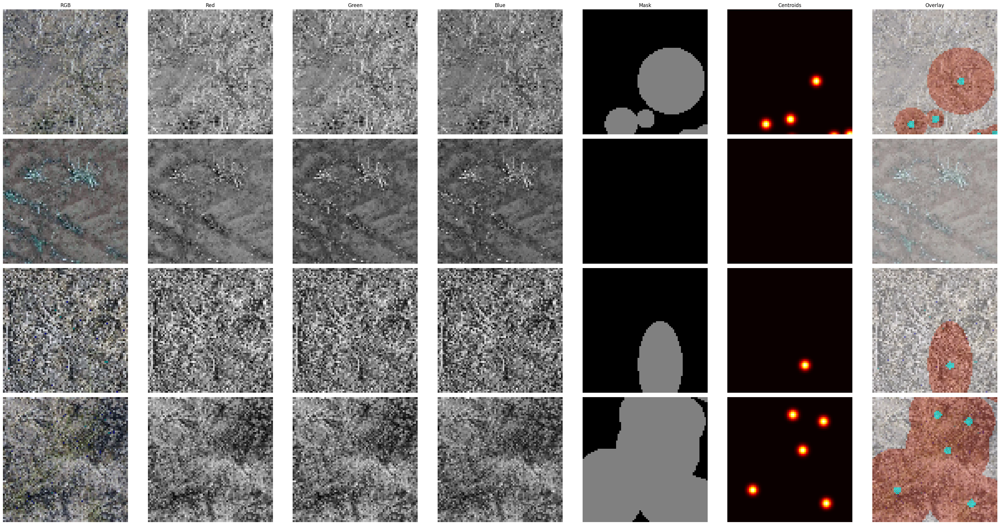

In [10]:
plot_batch(images, masks, centroids)

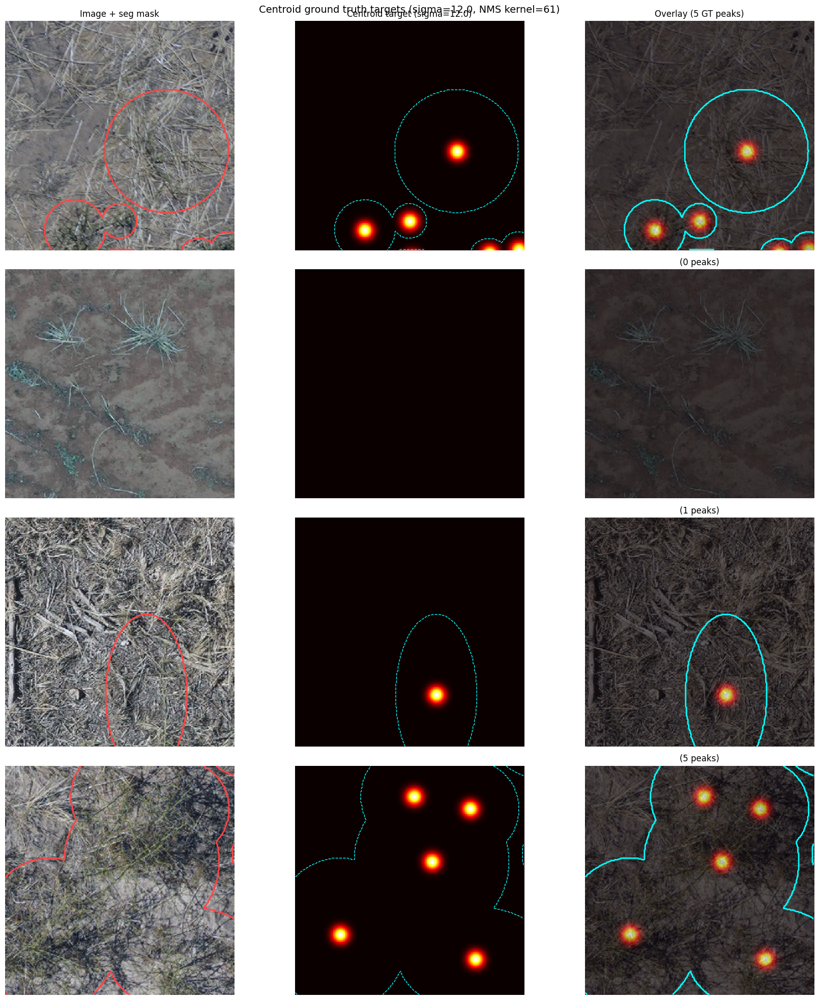

In [11]:
plot_centroid_targets(images, masks, centroids, centroid_sigma, nms_kernel)

Image stats (300x300)
Channel          Mean        Std        Min        Max
----------------------------------------------------
Red            0.0010     1.0303    -5.0344     3.7074
Green          0.0063     1.0321    -4.9041     4.4078
Blue          -0.0094     1.0368    -4.3724     5.5709
----------------------------------------------------
All.......    -0.0007     1.0331    -5.0344     5.5709


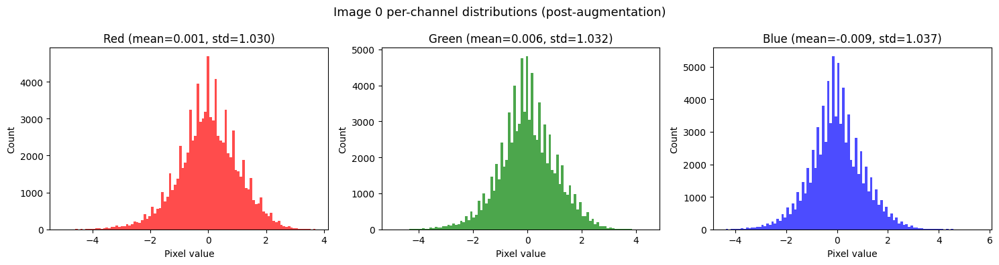

In [12]:
plot_channel_histograms(
    images[0], title="Image 0 per-channel distributions (post-augmentation)"
)

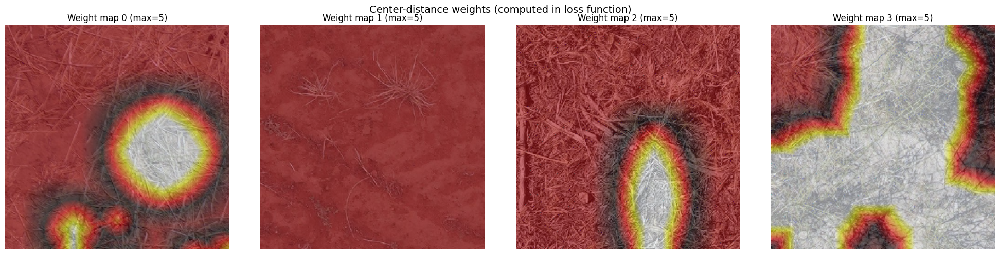

In [13]:
with torch.no_grad():
    weights = center_distance_weights(
        masks.long(), clip_distance=clip_distance, class_ramps=class_ramps
    )
plot_center_distance_weights(images, masks, weights)

In [14]:
model = UnetWithCentroids(
    encoder_name=f"tu-{model_type.split('.')[0]}",
    encoder_weights="imagenet",
    in_channels=3,
)

# Verify forward pass at both train and val canvas sizes
for cs, label in [(canvas_size, "train"), (val_canvas_size, "val")]:
    dummy = torch.randn(2, 3, cs, cs)
    out = model(dummy)
    print(f"{label} ({cs}px): input {dummy.shape} → output {out.shape}")
    assert out.shape == (2, 3, cs, cs), f"Expected (2, 3, {cs}, {cs})"

train (600px): input torch.Size([2, 3, 600, 600]) → output torch.Size([2, 3, 600, 600])
val (792px): input torch.Size([2, 3, 792, 792]) → output torch.Size([2, 3, 792, 792])


In [15]:
callbacks = [
    ShowGraphCallback(),
    GradientAccumulation(gradient_accumulation_batch_size),
    SaveModelCallback(monitor="fg_iou"),
]

learner = Learner(
    dls=dls,
    model=model,
    loss_func=DiceCELoss(
        dice_weight=dice_weight,
        ce_weight=ce_weight,
        centroid_weight=centroid_weight,
        centroid_pos_weight=centroid_pos_weight,
        clip_distance=clip_distance,
        class_ramps=class_ramps,
        ignore_index=ignore_index,
    ),
    metrics=[
        SegDiceMulti(ignore_index=ignore_index),
        ForegroundIoU(ignore_index=ignore_index),
        CentroidCountMAE(threshold=centroid_threshold, nms_kernel=nms_kernel),
        CentroidCountMAPE(threshold=centroid_threshold, nms_kernel=nms_kernel),
    ],
    cbs=callbacks,
)

In [16]:
if use_bf16:
    learner = learner.to_bf16()

epoch,train_loss,valid_loss,seg_dice_multi,fg_iou,cnt_mae,cnt_mape,time
0,8.355950,7.364637,0.826565,0.516957,1.666667,0.568858,00:47
1,5.954570,9.450268,0.472832,0.135789,1.888889,0.612519,00:31
2,4.727504,4.309723,0.839946,0.542442,1.866667,0.625297,00:27
3,4.187202,3.824651,0.856763,0.578717,1.866667,0.404757,00:26
4,3.653845,3.705729,0.851809,0.567484,1.777778,0.508876,00:25
5,3.416539,3.494220,0.862063,0.591440,1.866667,0.462090,00:25
6,3.213239,3.377050,0.855590,0.580788,1.911111,0.590070,00:25
7,2.976665,3.355703,0.861074,0.588892,1.533333,0.424987,00:25
8,2.670327,3.286685,0.864154,0.596816,1.911111,0.434647,00:27
9,2.723197,3.250787,0.864607,0.598672,1.244444,0.456293,00:26


Better model found at epoch 0 with fg_iou value: 0.5169567235026001.


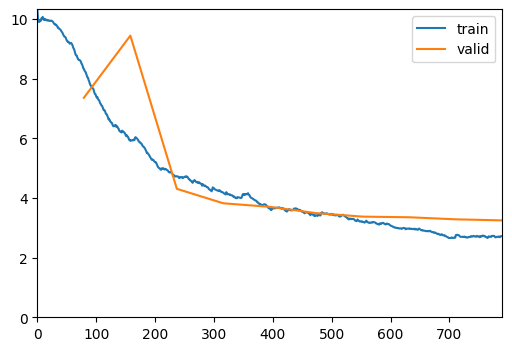

Better model found at epoch 2 with fg_iou value: 0.5424421959500262.
Better model found at epoch 3 with fg_iou value: 0.5787167988398375.
Better model found at epoch 5 with fg_iou value: 0.5914401532767453.
Better model found at epoch 8 with fg_iou value: 0.5968163805390244.
Better model found at epoch 9 with fg_iou value: 0.598672060538942.


In [17]:
learner.fit_one_cycle(
    n_epoch=epoch_count,
    lr_max=slice(learning_rate / 5, learning_rate),
)

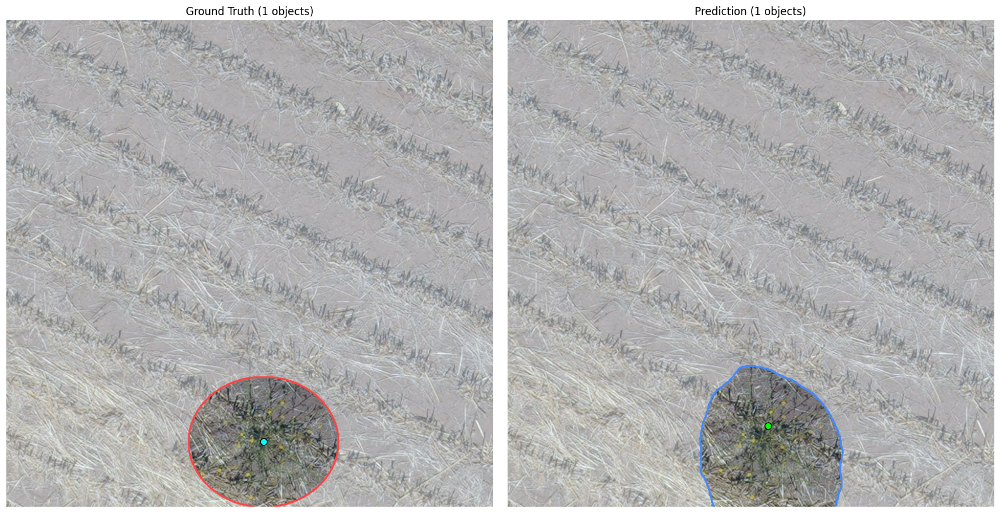

Image 0: GT 1 objects, Pred 1 objects


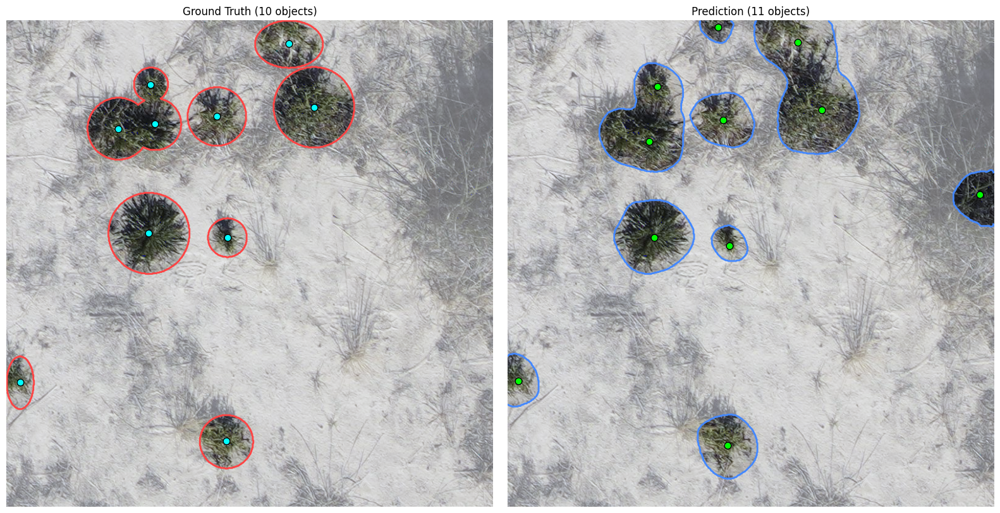

Image 1: GT 10 objects, Pred 11 objects


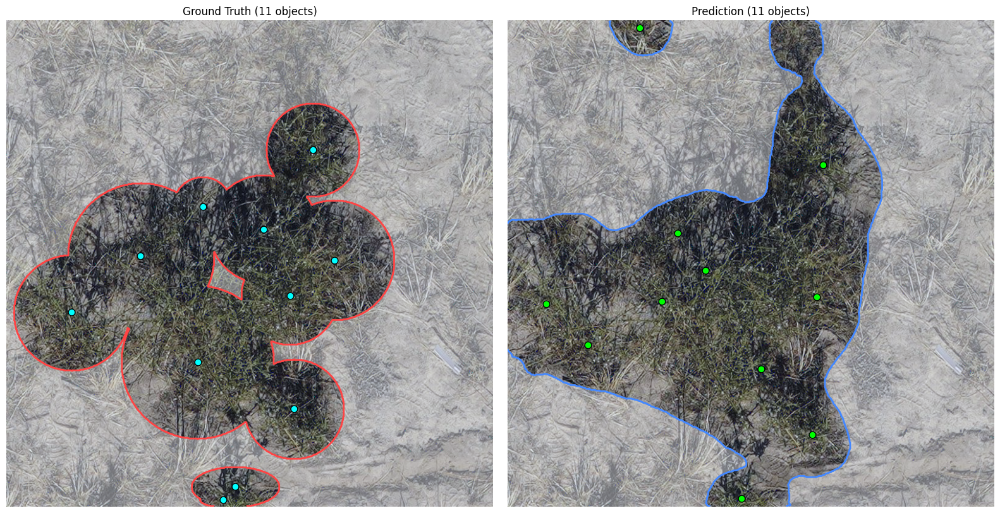

Image 2: GT 11 objects, Pred 11 objects


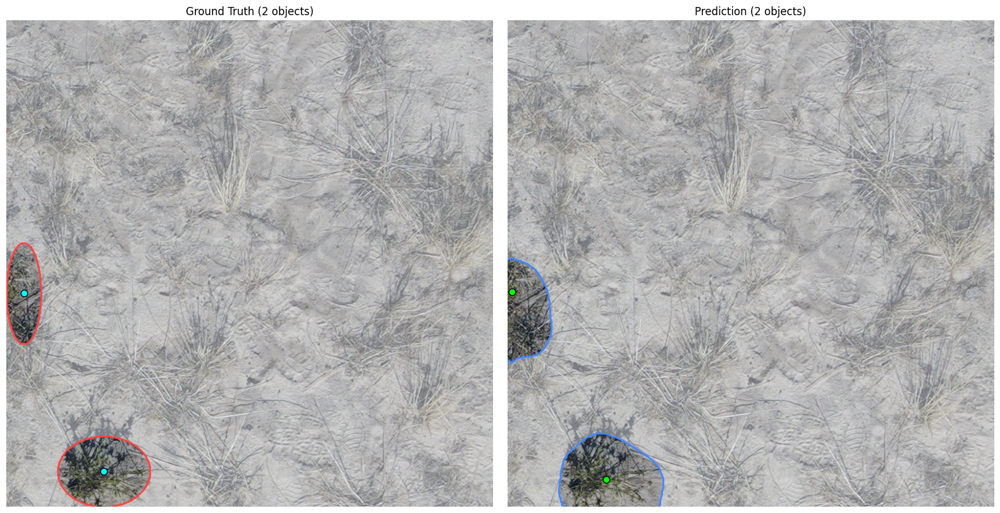

Image 3: GT 2 objects, Pred 2 objects


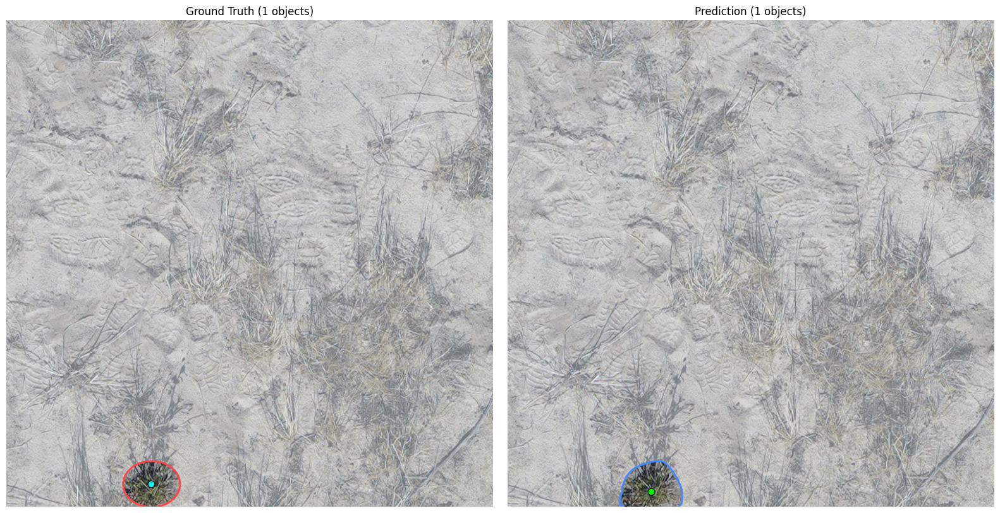

Image 4: GT 1 objects, Pred 1 objects


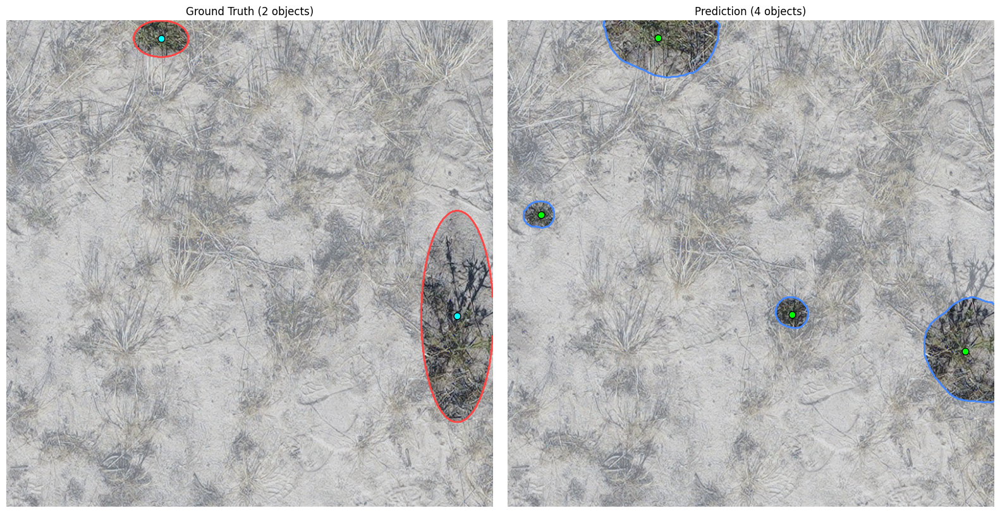

Image 5: GT 2 objects, Pred 4 objects


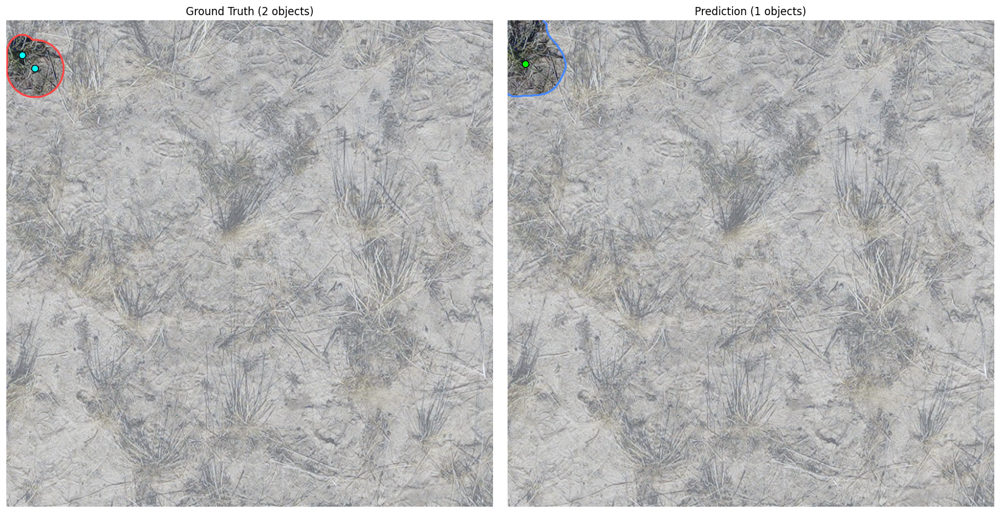

Image 6: GT 2 objects, Pred 1 objects


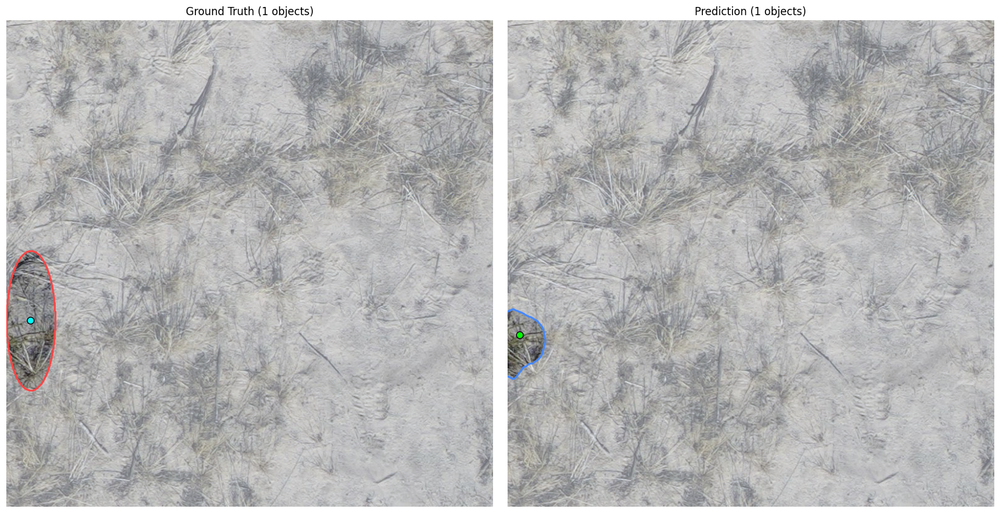

Image 7: GT 1 objects, Pred 1 objects


In [18]:
plot_val_predictions(learner, dls, centroid_threshold, nms_kernel)